In [1]:
# Import necessary Libraries
import pandas as pd
import seaborn as sns
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import BayesianRidge
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [2]:
# Import dataset
z=pd.read_csv(r"C:\Users\julia\PycharmProjects\usplrnmentalhealth\mental-heath-in-tech-2016_20161114.csv")
print(z)

      Are you self-employed?  \
0                          0   
1                          0   
2                          0   
3                          1   
4                          0   
...                      ...   
1428                       1   
1429                       1   
1430                       0   
1431                       0   
1432                       0   

     How many employees does your company or organization have?  \
0                                                26-100           
1                                                  6-25           
2                                                  6-25           
3                                                   NaN           
4                                                  6-25           
...                                                 ...           
1428                                                NaN           
1429                                                NaN           
1430        

In [3]:
# Listing column names
print(list(z.columns))

['Are you self-employed?', 'How many employees does your company or organization have?', 'Is your employer primarily a tech company/organization?', 'Is your primary role within your company related to tech/IT?', 'Does your employer provide mental health benefits as part of healthcare coverage?', 'Do you know the options for mental health care available under your employer-provided coverage?', 'Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?', 'Does your employer offer resources to learn more about mental health concerns and options for seeking help?', 'Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?', 'If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:', 'Do you think that discussing a mental health disorder with your employer would have negative cons

In [4]:
#Column Headers are too long
#Rename to shorter versions

In [5]:
z.columns = ['s-employed', 'No_Employees', 'Primarily_Tech', 'Tech_or_IT_role', 'mh_benefit_inclwcov', 'know_mh_options', 'Emp_Discuss_mh', 'Emp_offer_rsorces_re_mh', 'anonymity protected', 'Asking_mh_leave_wouldbe', 'Disc_mh_-ve_conseq?', 'Disc_PhysicalHealth_-ve_Conseq', 'Disc_mh_Cowork?', 'Disc_mh_DirSupervisor', 'Emp_mhvsph_asserious', 'heard_Obs_-veCons_b_mh', 'Your_coverage_Incl_mh', 'Know_localORonline_resources_mh', 'IfDiagmh_evrhadtoreveal_clientORbuscontacts', 'IfrevealmhTOclientORbc_-veCons?', 'IfDiagmh_everhadtorevealto coworkOREmployees', 'Ifrevealmh_cowork_Empl_-veCons?', 'Productivity_effBymh?', 'IfYprod_effbymh_percTime?', 'PrtevEmployers?', 'PrevEmpl_mhbenefitsProv?', 'Aware_prevEmpl_mhoptions', 'PrevEmpl_FDiscuss_mh', 'PrevEmpl_provideres_learnmh',  'Willing_Dismh_prevEmpl_supervisors''AnonymityProtected_ifusePrevEmplmhbenfit', 'DismhprevEmpl_-veCons?', 'Dis_ph_prevempl_-veconseq',  'Willing_Dismh_prevEmpl_C-Work', 'Willing_Dismh_prevEmpl_supervisors', 'PrevEmpl_mh=ph?', 'Hear_Obs_-veCons_mh_prevEmpl', 'Willing_mention_ph_interview?', 'Why_Y/N_ph', 'Willing_mention_mh_interview?', 'Why_Y/N_mh', 'Id_personmh_hurtcareer?', 'TEam/Cowork_viewUNeg_KnowUmh', 'Willing_Friend_fam_Uhavemh', 'UObs_exp_badResp_mh', 'Obs_anotherInddoscmh_nowU_lessLikelytoREvealmh', 'FamHist_mh', 'Umh_inpast?', 'U_Curr_mh', 'IfY_Condition?', 'IfMaybe_Whatmh_Ublv', 'Diagmh_medProf', 'IfY_condition?', 'USought_Rx4mh_frmMedProf?', 'IfYmh_InterferewWorkwhenRx?', 'IfYmh_InterferewWork_whennoRx', 'Age', 'Gender', 'Country_live', 'USState_live', 'Country_work', 'UsState_Work', 'Work_Position', 'Work_Remotely' ]

In [6]:
print(z.head())

   s-employed No_Employees  Primarily_Tech  Tech_or_IT_role  \
0           0       26-100             1.0              NaN   
1           0         6-25             1.0              NaN   
2           0         6-25             1.0              NaN   
3           1          NaN             NaN              NaN   
4           0         6-25             0.0              1.0   

               mh_benefit_inclwcov know_mh_options Emp_Discuss_mh  \
0  Not eligible for coverage / N/A             NaN             No   
1                               No             Yes            Yes   
2                               No             NaN             No   
3                              NaN             NaN            NaN   
4                              Yes             Yes             No   

  Emp_offer_rsorces_re_mh anonymity protected     Asking_mh_leave_wouldbe  \
0                      No        I don't know                   Very easy   
1                     Yes                 Yes       

In [7]:
#Change default options to see all the data
pd.set_option('display.max_rows', None)

In [8]:
# Lisiting number of Null fields per column to assess which features are missing a lot of data
print(z.isnull().sum())

s-employed                                                                       0
No_Employees                                                                   287
Primarily_Tech                                                                 287
Tech_or_IT_role                                                               1170
mh_benefit_inclwcov                                                            287
know_mh_options                                                                420
Emp_Discuss_mh                                                                 287
Emp_offer_rsorces_re_mh                                                        287
anonymity protected                                                            287
Asking_mh_leave_wouldbe                                                        287
Disc_mh_-ve_conseq?                                                            287
Disc_PhysicalHealth_-ve_Conseq                                                 287
Disc

In [9]:
# Creating a function to see the number of missing cells per column as a percentage
percentage_missing=z.isnull().sum()*100/len(z)

In [10]:
print(percentage_missing)

s-employed                                                                     0.000000
No_Employees                                                                  20.027913
Primarily_Tech                                                                20.027913
Tech_or_IT_role                                                               81.646895
mh_benefit_inclwcov                                                           20.027913
know_mh_options                                                               29.309142
Emp_Discuss_mh                                                                20.027913
Emp_offer_rsorces_re_mh                                                       20.027913
anonymity protected                                                           20.027913
Asking_mh_leave_wouldbe                                                       20.027913
Disc_mh_-ve_conseq?                                                           20.027913
Disc_PhysicalHealth_-ve_Conseq  

In [11]:
#drop columns where the percentage missing is greater than 20%
col_to_drop=percentage_missing[percentage_missing>20].keys()

In [12]:
col_to_drop

Index(['No_Employees', 'Primarily_Tech', 'Tech_or_IT_role',
       'mh_benefit_inclwcov', 'know_mh_options', 'Emp_Discuss_mh',
       'Emp_offer_rsorces_re_mh', 'anonymity protected',
       'Asking_mh_leave_wouldbe', 'Disc_mh_-ve_conseq?',
       'Disc_PhysicalHealth_-ve_Conseq', 'Disc_mh_Cowork?',
       'Disc_mh_DirSupervisor', 'Emp_mhvsph_asserious',
       'heard_Obs_-veCons_b_mh', 'Your_coverage_Incl_mh',
       'Know_localORonline_resources_mh',
       'IfDiagmh_evrhadtoreveal_clientORbuscontacts',
       'IfrevealmhTOclientORbc_-veCons?',
       'IfDiagmh_everhadtorevealto coworkOREmployees',
       'Ifrevealmh_cowork_Empl_-veCons?', 'Productivity_effBymh?',
       'IfYprod_effbymh_percTime?', 'Why_Y/N_ph', 'Why_Y/N_mh',
       'Obs_anotherInddoscmh_nowU_lessLikelytoREvealmh', 'IfY_Condition?',
       'IfMaybe_Whatmh_Ublv', 'IfY_condition?', 'USState_live',
       'UsState_Work'],
      dtype='object')

In [13]:
z.drop(col_to_drop, axis=1, inplace=True)

In [14]:
# checking to see if any rows are duplicated
# calculate duplicates
dups = z.duplicated()
# report if there are any duplicates
print(dups.any())

False


In [15]:
# Isolate columns where answers are non standardised by isolating features with more than 6 unique answers
nonstd_data_columns = []
for column in z.columns:
    if len(z[column].value_counts(dropna=False)) > 6:
        nonstd_data_columns.append(column)

        
for column in nonstd_data_columns:
    print(column)

Age
Gender
Country_live
Country_work
Work_Position


In [16]:
#Visualise problematic columns
for column in nonstd_data_columns:
     print("\n" + column)
     print(z[column].value_counts(dropna=False))


Age
30     94
31     82
29     79
28     74
35     74
32     72
33     69
34     69
26     64
27     63
37     59
39     55
38     54
36     50
25     44
24     42
40     36
22     32
44     31
43     30
42     29
45     27
23     24
41     24
46     22
21     15
47     14
49     13
55     12
50      9
48      9
54      7
52      7
51      7
20      6
56      5
63      4
57      4
19      4
53      3
61      2
59      2
66      1
74      1
65      1
15      1
17      1
3       1
58      1
62      1
323     1
99      1
70      1
Name: Age, dtype: int64

Gender
Male                                                                                                                                                             610
male                                                                                                                                                             249
Female                                                                                                 

In [17]:
# Isolate count of same and different values for ['Country_live'], ['Country_work']
s = (z.Country_live.eq(z.Country_work)
                    .value_counts()
                    .rename({True:'mach', False: 'no match'}))
s

mach        1407
no match      26
dtype: int64

In [18]:
# Work position feature too diverse and Country live data is essentially duplicated with country work
#dropping these 2 features
z.drop(['Work_Position', 'Country_live'], axis=1, inplace=True)

<AxesSubplot:xlabel='Age'>

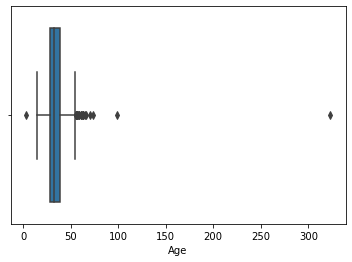

In [19]:
# to correct Age
#start by visualising distribuiton using boxplot
sns.boxplot(x=z['Age'])

In [20]:
# Use Tukey Rule to define and isolate outliers then drop
z['Age'].quantile(0.25)

28.0

In [21]:
z['Age'].quantile(0.75)

39.0

In [22]:
Q1 = z['Age'].quantile(0.25)
Q3 = z['Age'].quantile(0.75)
IQR = Q3-Q1

In [23]:
IQR

11.0

In [24]:
#IQR factor of 2 provided good overall results therefore setting upper and lower limits using this
low_lim = Q1 - 2*IQR
up_lim = Q3 + 2*IQR

In [25]:
low_lim

6.0

In [26]:
up_lim

61.0

In [27]:
#dropping rows where data is out of limits
z.drop(z[(z['Age']>up_lim) & (z['Age']<low_lim)].index, inplace=True)
z

,s-employed,PrtevEmployers?,PrevEmpl_mhbenefitsProv?,Aware_prevEmpl_mhoptions,PrevEmpl_FDiscuss_mh,PrevEmpl_provideres_learnmh,Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit,DismhprevEmpl_-veCons?,Dis_ph_prevempl_-veconseq,Willing_Dismh_prevEmpl_C-Work,...,Umh_inpast?,U_Curr_mh,Diagmh_medProf,USought_Rx4mh_frmMedProf?,IfYmh_InterferewWorkwhenRx?,IfYmh_InterferewWork_whennoRx,Age,Gender,Country_work,Work_Remotely
0,0,1,"No, none did",N/A (not currently aware),I don't know,None did,I don't know,Some of them,None of them,Some of my previous employers,...,Yes,No,Yes,0,Not applicable to me,Not applicable to me,39,Male,United Kingdom,Sometimes
1,0,1,"Yes, they all did",I was aware of some,None did,Some did,"Yes, always",None of them,None of them,"No, at none of my previous employers",...,Yes,Yes,Yes,1,Rarely,Sometimes,29,male,United States of America,Never
2,0,1,"No, none did",N/A (not currently aware),None did,Some did,I don't know,I don't know,Some of them,Some of my previous employers,...,Maybe,No,No,1,Not applicable to me,Not applicable to me,38,Male,United Kingdom,Always
3,1,1,Some did,N/A (not currently aware),None did,None did,I don't know,Some of them,Some of them,Some of my previous employers,...,Yes,Yes,Yes,1,Sometimes,Sometimes,43,male,United Kingdom,Sometimes
4,0,1,I don't know,N/A (not currently aware),Some did,None did,I don't know,Some of them,Some of them,"No, at none of my previous employers",...,Yes,Yes,Yes,1,Sometimes,Sometimes,43,Female,United States of America,Sometimes
5,0,1,"No, none did","Yes, I was aware of all of them",None did,None did,I don't know,"Yes, all of them",Some of them,"No, at none of my previous employers",...,No,Yes,No,1,Not applicable to me,Often,42,Male,United Kingdom,Sometimes
6,0,1,Some did,I was aware of some,None did,Some did,I don't know,None of them,None of them,Some of my previous employers,...,No,No,No,0,Not applicable to me,Not applicable to me,30,M,United States of America,Sometimes
7,0,1,Some did,I was aware of some,Some did,Some did,Sometimes,Some of them,Some of them,Some of my previous employers,...,Yes,Yes,Yes,1,Sometimes,Often,37,female,United States of America,Always
8,0,1,I don't know,N/A (not currently aware),Some did,None did,I don't know,"Yes, all of them","Yes, all of them","No, at none of my previous employers",...,Yes,Yes,Yes,1,Rarely,Often,44,Female,United States of America,Sometimes
9,1,1,Some did,I was aware of some,None did,None did,I don't know,Some of them,Some of them,Some of my previous employers,...,Yes,Yes,Yes,1,Rarely,Often,30,Male,United States of America,Always


In [28]:
z.drop(z[z['Age']>up_lim].index, inplace=True)
z

,s-employed,PrtevEmployers?,PrevEmpl_mhbenefitsProv?,Aware_prevEmpl_mhoptions,PrevEmpl_FDiscuss_mh,PrevEmpl_provideres_learnmh,Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit,DismhprevEmpl_-veCons?,Dis_ph_prevempl_-veconseq,Willing_Dismh_prevEmpl_C-Work,...,Umh_inpast?,U_Curr_mh,Diagmh_medProf,USought_Rx4mh_frmMedProf?,IfYmh_InterferewWorkwhenRx?,IfYmh_InterferewWork_whennoRx,Age,Gender,Country_work,Work_Remotely
0,0,1,"No, none did",N/A (not currently aware),I don't know,None did,I don't know,Some of them,None of them,Some of my previous employers,...,Yes,No,Yes,0,Not applicable to me,Not applicable to me,39,Male,United Kingdom,Sometimes
1,0,1,"Yes, they all did",I was aware of some,None did,Some did,"Yes, always",None of them,None of them,"No, at none of my previous employers",...,Yes,Yes,Yes,1,Rarely,Sometimes,29,male,United States of America,Never
2,0,1,"No, none did",N/A (not currently aware),None did,Some did,I don't know,I don't know,Some of them,Some of my previous employers,...,Maybe,No,No,1,Not applicable to me,Not applicable to me,38,Male,United Kingdom,Always
3,1,1,Some did,N/A (not currently aware),None did,None did,I don't know,Some of them,Some of them,Some of my previous employers,...,Yes,Yes,Yes,1,Sometimes,Sometimes,43,male,United Kingdom,Sometimes
4,0,1,I don't know,N/A (not currently aware),Some did,None did,I don't know,Some of them,Some of them,"No, at none of my previous employers",...,Yes,Yes,Yes,1,Sometimes,Sometimes,43,Female,United States of America,Sometimes
5,0,1,"No, none did","Yes, I was aware of all of them",None did,None did,I don't know,"Yes, all of them",Some of them,"No, at none of my previous employers",...,No,Yes,No,1,Not applicable to me,Often,42,Male,United Kingdom,Sometimes
6,0,1,Some did,I was aware of some,None did,Some did,I don't know,None of them,None of them,Some of my previous employers,...,No,No,No,0,Not applicable to me,Not applicable to me,30,M,United States of America,Sometimes
7,0,1,Some did,I was aware of some,Some did,Some did,Sometimes,Some of them,Some of them,Some of my previous employers,...,Yes,Yes,Yes,1,Sometimes,Often,37,female,United States of America,Always
8,0,1,I don't know,N/A (not currently aware),Some did,None did,I don't know,"Yes, all of them","Yes, all of them","No, at none of my previous employers",...,Yes,Yes,Yes,1,Rarely,Often,44,Female,United States of America,Sometimes
9,1,1,Some did,I was aware of some,None did,None did,I don't know,Some of them,Some of them,Some of my previous employers,...,Yes,Yes,Yes,1,Rarely,Often,30,Male,United States of America,Always


In [29]:
z.drop(z[z['Age']<low_lim].index, inplace=True)
z

,s-employed,PrtevEmployers?,PrevEmpl_mhbenefitsProv?,Aware_prevEmpl_mhoptions,PrevEmpl_FDiscuss_mh,PrevEmpl_provideres_learnmh,Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit,DismhprevEmpl_-veCons?,Dis_ph_prevempl_-veconseq,Willing_Dismh_prevEmpl_C-Work,...,Umh_inpast?,U_Curr_mh,Diagmh_medProf,USought_Rx4mh_frmMedProf?,IfYmh_InterferewWorkwhenRx?,IfYmh_InterferewWork_whennoRx,Age,Gender,Country_work,Work_Remotely
0,0,1,"No, none did",N/A (not currently aware),I don't know,None did,I don't know,Some of them,None of them,Some of my previous employers,...,Yes,No,Yes,0,Not applicable to me,Not applicable to me,39,Male,United Kingdom,Sometimes
1,0,1,"Yes, they all did",I was aware of some,None did,Some did,"Yes, always",None of them,None of them,"No, at none of my previous employers",...,Yes,Yes,Yes,1,Rarely,Sometimes,29,male,United States of America,Never
2,0,1,"No, none did",N/A (not currently aware),None did,Some did,I don't know,I don't know,Some of them,Some of my previous employers,...,Maybe,No,No,1,Not applicable to me,Not applicable to me,38,Male,United Kingdom,Always
3,1,1,Some did,N/A (not currently aware),None did,None did,I don't know,Some of them,Some of them,Some of my previous employers,...,Yes,Yes,Yes,1,Sometimes,Sometimes,43,male,United Kingdom,Sometimes
4,0,1,I don't know,N/A (not currently aware),Some did,None did,I don't know,Some of them,Some of them,"No, at none of my previous employers",...,Yes,Yes,Yes,1,Sometimes,Sometimes,43,Female,United States of America,Sometimes
5,0,1,"No, none did","Yes, I was aware of all of them",None did,None did,I don't know,"Yes, all of them",Some of them,"No, at none of my previous employers",...,No,Yes,No,1,Not applicable to me,Often,42,Male,United Kingdom,Sometimes
6,0,1,Some did,I was aware of some,None did,Some did,I don't know,None of them,None of them,Some of my previous employers,...,No,No,No,0,Not applicable to me,Not applicable to me,30,M,United States of America,Sometimes
7,0,1,Some did,I was aware of some,Some did,Some did,Sometimes,Some of them,Some of them,Some of my previous employers,...,Yes,Yes,Yes,1,Sometimes,Often,37,female,United States of America,Always
8,0,1,I don't know,N/A (not currently aware),Some did,None did,I don't know,"Yes, all of them","Yes, all of them","No, at none of my previous employers",...,Yes,Yes,Yes,1,Rarely,Often,44,Female,United States of America,Sometimes
9,1,1,Some did,I was aware of some,None did,None did,I don't know,Some of them,Some of them,Some of my previous employers,...,Yes,Yes,Yes,1,Rarely,Often,30,Male,United States of America,Always


In [30]:
#checking final age distribution
print(z['Age'].value_counts(dropna=False))

30    94
31    82
29    79
35    74
28    74
32    72
33    69
34    69
26    64
27    63
37    59
39    55
38    54
36    50
25    44
24    42
40    36
22    32
44    31
43    30
42    29
45    27
41    24
23    24
46    22
21    15
47    14
49    13
55    12
48     9
50     9
52     7
51     7
54     7
20     6
56     5
19     4
57     4
53     3
61     2
59     2
17     1
58     1
15     1
Name: Age, dtype: int64


In [31]:
# Standardize genders to female, male, and other
# Define all male genders as male
male = ["male", "m", "man", "cis male", "male (cis)", "dude", "mail", "m|",
        "i'm a man why didn't you make this a drop down question. you should of asked sex? and i would of "
        "answered yes please. seriously how much text can this take?", "cisdude", "cis man", "male.", "nb masculine",
        "sex is male", "malr", "Male"]

# Define all female genders as females
female = ["female", "f", "woman", "fem", "i identify as female.", "Female",
          "female (props for making this a freeform field, though)", "cis-woman",
          "female-bodied; no feelings about gender", "female/woman", "cis female", "fm"]

# Change naming to male and female, rest is assigned to other
z["Gender"] = z["Gender"].replace(male, 'male')
z["Gender"] = z["Gender"].replace(female, 'female')
other = list(z["Gender"].value_counts().index)[2:]
z["Gender"] = z["Gender"].replace(other, 'other')
# Fill the  missing values for Gender with others
z["Gender"] = z["Gender"].fillna("other")

In [32]:
# Checking gender feature to make sure all variables are dealt with correctly
z.value_counts("Gender")

Gender
male      939
female    278
other     204
dtype: int64

In [33]:
#visusalising data at this point
for column in z.columns:
     print("\n" + column)
     print(z[column].value_counts(dropna=False))


s-employed
0    1137
1     284
Name: s-employed, dtype: int64

PrtevEmployers?
1    1253
0     168
Name: PrtevEmployers?, dtype: int64

PrevEmpl_mhbenefitsProv?
Some did             387
No, none did         371
I don't know         311
Yes, they all did    184
NaN                  168
Name: PrevEmpl_mhbenefitsProv?, dtype: int64

Aware_prevEmpl_mhoptions
N/A (not currently aware)          578
I was aware of some                379
Yes, I was aware of all of them    180
NaN                                168
No, I only became aware later      116
Name: Aware_prevEmpl_mhoptions, dtype: int64

PrevEmpl_FDiscuss_mh
None did             882
Some did             253
NaN                  168
I don't know          85
Yes, they all did     33
Name: PrevEmpl_FDiscuss_mh, dtype: int64

PrevEmpl_provideres_learnmh
None did             835
Some did             368
NaN                  168
Yes, they all did     50
Name: PrevEmpl_provideres_learnmh, dtype: int64

Willing_Dismh_prevEmpl_supervisorsAn

In [34]:
#overall current structure of dataset
print("""
The dataset contains  """ + str(z.shape[0]) + " rows and " + str(z.shape[1]) +  " columns.")


The dataset contains  1421 rows and 30 columns.


In [35]:
# List options where there are less than 6 variants in a column and assign them to variable option_columns
option_columns = []
for value in z.columns:
    if len(z[column].value_counts(dropna=False)) <6:
        option_columns.append(value)

        
for column in option_columns:
    print(column)

s-employed
PrtevEmployers?
PrevEmpl_mhbenefitsProv?
Aware_prevEmpl_mhoptions
PrevEmpl_FDiscuss_mh
PrevEmpl_provideres_learnmh
Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit
DismhprevEmpl_-veCons?
Dis_ph_prevempl_-veconseq
Willing_Dismh_prevEmpl_C-Work
Willing_Dismh_prevEmpl_supervisors
PrevEmpl_mh=ph?
Hear_Obs_-veCons_mh_prevEmpl
Willing_mention_ph_interview?
Willing_mention_mh_interview?
Id_personmh_hurtcareer?
TEam/Cowork_viewUNeg_KnowUmh
Willing_Friend_fam_Uhavemh
UObs_exp_badResp_mh
FamHist_mh
Umh_inpast?
U_Curr_mh
Diagmh_medProf
USought_Rx4mh_frmMedProf?
IfYmh_InterferewWorkwhenRx?
IfYmh_InterferewWork_whennoRx
Age
Gender
Country_work
Work_Remotely


In [36]:
option_columns

['s-employed',
 'PrtevEmployers?',
 'PrevEmpl_mhbenefitsProv?',
 'Aware_prevEmpl_mhoptions',
 'PrevEmpl_FDiscuss_mh',
 'PrevEmpl_provideres_learnmh',
 'Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit',
 'DismhprevEmpl_-veCons?',
 'Dis_ph_prevempl_-veconseq',
 'Willing_Dismh_prevEmpl_C-Work',
 'Willing_Dismh_prevEmpl_supervisors',
 'PrevEmpl_mh=ph?',
 'Hear_Obs_-veCons_mh_prevEmpl',
 'Willing_mention_ph_interview?',
 'Willing_mention_mh_interview?',
 'Id_personmh_hurtcareer?',
 'TEam/Cowork_viewUNeg_KnowUmh',
 'Willing_Friend_fam_Uhavemh',
 'UObs_exp_badResp_mh',
 'FamHist_mh',
 'Umh_inpast?',
 'U_Curr_mh',
 'Diagmh_medProf',
 'USought_Rx4mh_frmMedProf?',
 'IfYmh_InterferewWorkwhenRx?',
 'IfYmh_InterferewWork_whennoRx',
 'Age',
 'Gender',
 'Country_work',
 'Work_Remotely']

In [37]:
concatanated=pd.concat([z['s-employed'],
 z['PrtevEmployers?'],
 z['Aware_prevEmpl_mhoptions'],
 z['PrevEmpl_FDiscuss_mh'],
 z['PrevEmpl_provideres_learnmh'],
 z['Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit'],
 z['DismhprevEmpl_-veCons?'],
 z['Dis_ph_prevempl_-veconseq'],
 z['Willing_Dismh_prevEmpl_C-Work'],
 z['Willing_Dismh_prevEmpl_supervisors'],
 z['PrevEmpl_mh=ph?'],
 z['Hear_Obs_-veCons_mh_prevEmpl'],
 z['Willing_mention_ph_interview?'],
 z['Willing_mention_mh_interview?'],
 z['Id_personmh_hurtcareer?'],
 z['TEam/Cowork_viewUNeg_KnowUmh'],
 z['Willing_Friend_fam_Uhavemh'],
 z['UObs_exp_badResp_mh'],
 z['FamHist_mh'],
 z['Umh_inpast?'],
 z['U_Curr_mh'],
 z['Diagmh_medProf'],
 z['USought_Rx4mh_frmMedProf?'],
 z['IfYmh_InterferewWorkwhenRx?'],
 z['IfYmh_InterferewWork_whennoRx'],
 z['Work_Remotely']])

In [38]:
concatanated.value_counts()

No                                                       4168
Yes                                                      3137
Maybe                                                    2800
1                                                        2365
None did                                                 2175
I don't know                                             1944
0                                                        1898
Some of them                                             1675
Sometimes                                                1596
None of them                                             1420
Some of my previous employers                            1380
Some did                                                 1045
Not applicable to me                                     1020
No, at none of my previous employers                      840
Somewhat open                                             635
Often                                                     597
N/A (not

In [39]:
#Define each consolidated variable into ratings of  1 to 5 with 1 = No or None and 5 = Yes or always
Unknown = ["unknown", "Maybe", "I don't know", "Maybe/Not sure", "Neutral", "I am not sure", "Neither easy nor difficult" ]
No = ["No", "No, I only became aware later", "No, at none of my previous employers", "No, I don't think it would", "No, I don't think they would", 
"No, they do not", "No, it has not", 0]
Yes = ["Yes", "Yes, they all did", "Yes, at all of my previous employers","Yes, I was aware of all of them", 
"Yes, I think it would", "Yes, I think they would", "Yes, all of them", "Yes, I experienced", "Yes, always", 
"Yes, it has", "Yes, they do", "Yes, I observed", "Always", 1]
NA = ["Not applicable to me", "Not applicable to me (I do not have a mental illness)", "Not eligible for coverage / N/A", 
"N/A (not currently aware)"]
Some = ["Some of them", "Some did", "Some of my previous employers", "I was aware of some"]
N_one = ["None did", "No, none did", "None of them" ]
Positive = ["Often", "Very easy", "Very open", "open"]
Inbetween = ["Sometimes",  "Somewhat easy", "Somewhat difficult", "Somewhat open", "Somewhat not open", "Rarely"]
Negative = ["Never", "Very difficult", "Not open at all"]

z=z.replace(Yes, 5)
z=z.replace(No, 1)
z=z.replace(Unknown, 3)
z=z.replace(NA, 3)
z=z.replace(Some, 2)
z=z.replace(N_one, 1)
z=z.replace(Positive, 4)
z=z.replace(Inbetween, 2)
z=z.replace(Negative, 1)
            
            

In [40]:
#checking results
for column in z.columns:
     print("\n" + column)
     print(z[column].value_counts(dropna=False))


s-employed
1    1137
5     284
Name: s-employed, dtype: int64

PrtevEmployers?
5    1253
1     168
Name: PrtevEmployers?, dtype: int64

PrevEmpl_mhbenefitsProv?
2.0    387
1.0    371
3.0    311
5.0    184
NaN    168
Name: PrevEmpl_mhbenefitsProv?, dtype: int64

Aware_prevEmpl_mhoptions
3.0    578
2.0    379
5.0    180
NaN    168
1.0    116
Name: Aware_prevEmpl_mhoptions, dtype: int64

PrevEmpl_FDiscuss_mh
1.0    882
2.0    253
NaN    168
3.0     85
5.0     33
Name: PrevEmpl_FDiscuss_mh, dtype: int64

PrevEmpl_provideres_learnmh
1.0    835
2.0    368
NaN    168
5.0     50
Name: PrevEmpl_provideres_learnmh, dtype: int64

Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit
3.0    854
NaN    168
5.0    161
2.0    119
1.0    119
Name: Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit, dtype: int64

DismhprevEmpl_-veCons?
2.0    611
3.0    307
5.0    223
NaN    168
1.0    112
Name: DismhprevEmpl_-veCons?, dtype: int64

Dis_ph_prevempl_-veconse

In [41]:
print('The type of each column is: \n', z.dtypes)

The type of each column is: 
 s-employed                                                                      int64
PrtevEmployers?                                                                 int64
PrevEmpl_mhbenefitsProv?                                                      float64
Aware_prevEmpl_mhoptions                                                      float64
PrevEmpl_FDiscuss_mh                                                          float64
PrevEmpl_provideres_learnmh                                                   float64
Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit    float64
DismhprevEmpl_-veCons?                                                        float64
Dis_ph_prevempl_-veconseq                                                     float64
Willing_Dismh_prevEmpl_C-Work                                                 float64
Willing_Dismh_prevEmpl_supervisors                                            float64
PrevEmpl_mh=ph?         

In [42]:
z = z.reset_index(drop=True)

In [43]:
print('The type of each column is: \n', z.dtypes)

The type of each column is: 
 s-employed                                                                      int64
PrtevEmployers?                                                                 int64
PrevEmpl_mhbenefitsProv?                                                      float64
Aware_prevEmpl_mhoptions                                                      float64
PrevEmpl_FDiscuss_mh                                                          float64
PrevEmpl_provideres_learnmh                                                   float64
Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit    float64
DismhprevEmpl_-veCons?                                                        float64
Dis_ph_prevempl_-veconseq                                                     float64
Willing_Dismh_prevEmpl_C-Work                                                 float64
Willing_Dismh_prevEmpl_supervisors                                            float64
PrevEmpl_mh=ph?         

In [44]:
# Isolate object columns
nan_cols = z.select_dtypes(exclude = 'object').columns

In [45]:
z_nan=z[nan_cols]

In [46]:
z_nan

,s-employed,PrtevEmployers?,PrevEmpl_mhbenefitsProv?,Aware_prevEmpl_mhoptions,PrevEmpl_FDiscuss_mh,PrevEmpl_provideres_learnmh,Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit,DismhprevEmpl_-veCons?,Dis_ph_prevempl_-veconseq,Willing_Dismh_prevEmpl_C-Work,...,UObs_exp_badResp_mh,FamHist_mh,Umh_inpast?,U_Curr_mh,Diagmh_medProf,USought_Rx4mh_frmMedProf?,IfYmh_InterferewWorkwhenRx?,IfYmh_InterferewWork_whennoRx,Age,Work_Remotely
0,1,5,1.0,3.0,3.0,1.0,3.0,2.0,1.0,2.0,...,1.0,1,5,1,5,1,3,3,39,2
1,1,5,5.0,2.0,1.0,2.0,5.0,1.0,1.0,1.0,...,1.0,5,5,5,5,5,2,2,29,1
2,1,5,1.0,3.0,1.0,2.0,3.0,3.0,2.0,2.0,...,3.0,1,3,1,1,5,3,3,38,5
3,5,5,2.0,3.0,1.0,1.0,3.0,2.0,2.0,2.0,...,1.0,1,5,5,5,5,2,2,43,2
4,1,5,3.0,3.0,2.0,1.0,3.0,2.0,2.0,1.0,...,5.0,5,5,5,5,5,2,2,43,2
5,1,5,1.0,5.0,1.0,1.0,3.0,5.0,2.0,1.0,...,5.0,1,1,5,1,5,3,4,42,2
6,1,5,2.0,2.0,1.0,2.0,3.0,1.0,1.0,2.0,...,1.0,1,1,1,1,1,3,3,30,2
7,1,5,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,5.0,5,5,5,5,5,2,4,37,5
8,1,5,3.0,3.0,2.0,1.0,3.0,5.0,5.0,1.0,...,5.0,5,5,5,5,5,2,4,44,2
9,5,5,2.0,2.0,1.0,1.0,3.0,2.0,2.0,2.0,...,1.0,5,5,5,5,5,2,4,30,5


In [47]:
# Replace nan values with BayesianRdige Regressor, that calculates the data points dependent from other answers

imp = IterativeImputer(BayesianRidge())
df_imputed = imp.fit_transform(z_nan)

In [48]:
df_imputed

array([[ 1.        ,  5.        ,  1.        , ...,  3.        ,
        39.        ,  2.        ],
       [ 1.        ,  5.        ,  5.        , ...,  2.        ,
        29.        ,  1.        ],
       [ 1.        ,  5.        ,  1.        , ...,  3.        ,
        38.        ,  5.        ],
       ...,
       [ 1.        ,  5.        ,  2.        , ...,  2.        ,
        52.        ,  2.        ],
       [ 1.        ,  5.        ,  1.        , ...,  4.        ,
        30.        ,  2.        ],
       [ 1.        ,  1.        ,  1.94130944, ...,  4.        ,
        25.        ,  2.        ]])

In [49]:
df_numerical_trained = pd.DataFrame(df_imputed, columns = nan_cols)
df_numerical_trained = df_numerical_trained.round(decimals=1)

In [50]:
df_numerical_trained

,s-employed,PrtevEmployers?,PrevEmpl_mhbenefitsProv?,Aware_prevEmpl_mhoptions,PrevEmpl_FDiscuss_mh,PrevEmpl_provideres_learnmh,Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit,DismhprevEmpl_-veCons?,Dis_ph_prevempl_-veconseq,Willing_Dismh_prevEmpl_C-Work,...,UObs_exp_badResp_mh,FamHist_mh,Umh_inpast?,U_Curr_mh,Diagmh_medProf,USought_Rx4mh_frmMedProf?,IfYmh_InterferewWorkwhenRx?,IfYmh_InterferewWork_whennoRx,Age,Work_Remotely
0,1.0,5.0,1.0,3.0,3.0,1.0,3.0,2.0,1.0,2.0,...,1.0,1.0,5.0,1.0,5.0,1.0,3.0,3.0,39.0,2.0
1,1.0,5.0,5.0,2.0,1.0,2.0,5.0,1.0,1.0,1.0,...,1.0,5.0,5.0,5.0,5.0,5.0,2.0,2.0,29.0,1.0
2,1.0,5.0,1.0,3.0,1.0,2.0,3.0,3.0,2.0,2.0,...,3.0,1.0,3.0,1.0,1.0,5.0,3.0,3.0,38.0,5.0
3,5.0,5.0,2.0,3.0,1.0,1.0,3.0,2.0,2.0,2.0,...,1.0,1.0,5.0,5.0,5.0,5.0,2.0,2.0,43.0,2.0
4,1.0,5.0,3.0,3.0,2.0,1.0,3.0,2.0,2.0,1.0,...,5.0,5.0,5.0,5.0,5.0,5.0,2.0,2.0,43.0,2.0
5,1.0,5.0,1.0,5.0,1.0,1.0,3.0,5.0,2.0,1.0,...,5.0,1.0,1.0,5.0,1.0,5.0,3.0,4.0,42.0,2.0
6,1.0,5.0,2.0,2.0,1.0,2.0,3.0,1.0,1.0,2.0,...,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,30.0,2.0
7,1.0,5.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,5.0,5.0,5.0,5.0,5.0,5.0,2.0,4.0,37.0,5.0
8,1.0,5.0,3.0,3.0,2.0,1.0,3.0,5.0,5.0,1.0,...,5.0,5.0,5.0,5.0,5.0,5.0,2.0,4.0,44.0,2.0
9,5.0,5.0,2.0,2.0,1.0,1.0,3.0,2.0,2.0,2.0,...,1.0,5.0,5.0,5.0,5.0,5.0,2.0,4.0,30.0,5.0


In [51]:
#Isolating categorical features
cat_cols = z.select_dtypes(include = 'object').columns

In [52]:
z_cat=z[cat_cols]

In [53]:
# Apply One hot encoding to categorical features
cat_OHE = pd.get_dummies(z_cat)

In [54]:
cat_OHE

,Gender_female,Gender_male,Gender_other,Country_work_Afghanistan,Country_work_Argentina,Country_work_Australia,Country_work_Austria,Country_work_Bangladesh,Country_work_Belgium,Country_work_Bosnia and Herzegovina,...,Country_work_South Africa,Country_work_Spain,Country_work_Sweden,Country_work_Switzerland,Country_work_Turkey,Country_work_United Arab Emirates,Country_work_United Kingdom,Country_work_United States of America,Country_work_Venezuela,Country_work_Vietnam
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [55]:
#Combine modified option and categorical data toegther to form one dataframe 
df_final = pd.concat([df_numerical_trained, cat_OHE], axis=1)

In [56]:
df_final

,s-employed,PrtevEmployers?,PrevEmpl_mhbenefitsProv?,Aware_prevEmpl_mhoptions,PrevEmpl_FDiscuss_mh,PrevEmpl_provideres_learnmh,Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit,DismhprevEmpl_-veCons?,Dis_ph_prevempl_-veconseq,Willing_Dismh_prevEmpl_C-Work,...,Country_work_South Africa,Country_work_Spain,Country_work_Sweden,Country_work_Switzerland,Country_work_Turkey,Country_work_United Arab Emirates,Country_work_United Kingdom,Country_work_United States of America,Country_work_Venezuela,Country_work_Vietnam
0,1.0,5.0,1.0,3.0,3.0,1.0,3.0,2.0,1.0,2.0,...,0,0,0,0,0,0,1,0,0,0
1,1.0,5.0,5.0,2.0,1.0,2.0,5.0,1.0,1.0,1.0,...,0,0,0,0,0,0,0,1,0,0
2,1.0,5.0,1.0,3.0,1.0,2.0,3.0,3.0,2.0,2.0,...,0,0,0,0,0,0,1,0,0,0
3,5.0,5.0,2.0,3.0,1.0,1.0,3.0,2.0,2.0,2.0,...,0,0,0,0,0,0,1,0,0,0
4,1.0,5.0,3.0,3.0,2.0,1.0,3.0,2.0,2.0,1.0,...,0,0,0,0,0,0,0,1,0,0
5,1.0,5.0,1.0,5.0,1.0,1.0,3.0,5.0,2.0,1.0,...,0,0,0,0,0,0,1,0,0,0
6,1.0,5.0,2.0,2.0,1.0,2.0,3.0,1.0,1.0,2.0,...,0,0,0,0,0,0,0,1,0,0
7,1.0,5.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,0,0,0,0,0,0,0,1,0,0
8,1.0,5.0,3.0,3.0,2.0,1.0,3.0,5.0,5.0,1.0,...,0,0,0,0,0,0,0,1,0,0
9,5.0,5.0,2.0,2.0,1.0,1.0,3.0,2.0,2.0,2.0,...,0,0,0,0,0,0,0,1,0,0


In [57]:
#check to make sure no null values remaining
print(df_final.isnull().sum())

s-employed                                                                    0
PrtevEmployers?                                                               0
PrevEmpl_mhbenefitsProv?                                                      0
Aware_prevEmpl_mhoptions                                                      0
PrevEmpl_FDiscuss_mh                                                          0
PrevEmpl_provideres_learnmh                                                   0
Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit    0
DismhprevEmpl_-veCons?                                                        0
Dis_ph_prevempl_-veconseq                                                     0
Willing_Dismh_prevEmpl_C-Work                                                 0
Willing_Dismh_prevEmpl_supervisors                                            0
PrevEmpl_mh=ph?                                                               0
Hear_Obs_-veCons_mh_prevEmpl            

In [58]:
#checking modified dataframe shape
df_final.shape

(1421, 84)

In [59]:
#Isolating column names
print(list(df_final))

['s-employed', 'PrtevEmployers?', 'PrevEmpl_mhbenefitsProv?', 'Aware_prevEmpl_mhoptions', 'PrevEmpl_FDiscuss_mh', 'PrevEmpl_provideres_learnmh', 'Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit', 'DismhprevEmpl_-veCons?', 'Dis_ph_prevempl_-veconseq', 'Willing_Dismh_prevEmpl_C-Work', 'Willing_Dismh_prevEmpl_supervisors', 'PrevEmpl_mh=ph?', 'Hear_Obs_-veCons_mh_prevEmpl', 'Willing_mention_ph_interview?', 'Willing_mention_mh_interview?', 'Id_personmh_hurtcareer?', 'TEam/Cowork_viewUNeg_KnowUmh', 'Willing_Friend_fam_Uhavemh', 'UObs_exp_badResp_mh', 'FamHist_mh', 'Umh_inpast?', 'U_Curr_mh', 'Diagmh_medProf', 'USought_Rx4mh_frmMedProf?', 'IfYmh_InterferewWorkwhenRx?', 'IfYmh_InterferewWork_whennoRx', 'Age', 'Work_Remotely', 'Gender_female', 'Gender_male', 'Gender_other', 'Country_work_Afghanistan', 'Country_work_Argentina', 'Country_work_Australia', 'Country_work_Austria', 'Country_work_Bangladesh', 'Country_work_Belgium', 'Country_work_Bosnia and Herzegovina', 'Co

In [60]:
Column_names=df_final.columns

In [61]:
# Standerdising dataframe by scaling and fitting to a normal Gaussian distribution type shape.
X_std = StandardScaler().fit_transform(df_final)
X_std.shape

(1421, 84)

In [62]:
# Create a new DataFrame with the scaled data and original column names

X_Std_Scaled = pd.DataFrame(X_std, columns=Column_names)

In [63]:
# Calculate correlation matrix
corr_matrix = X_Std_Scaled.corr()

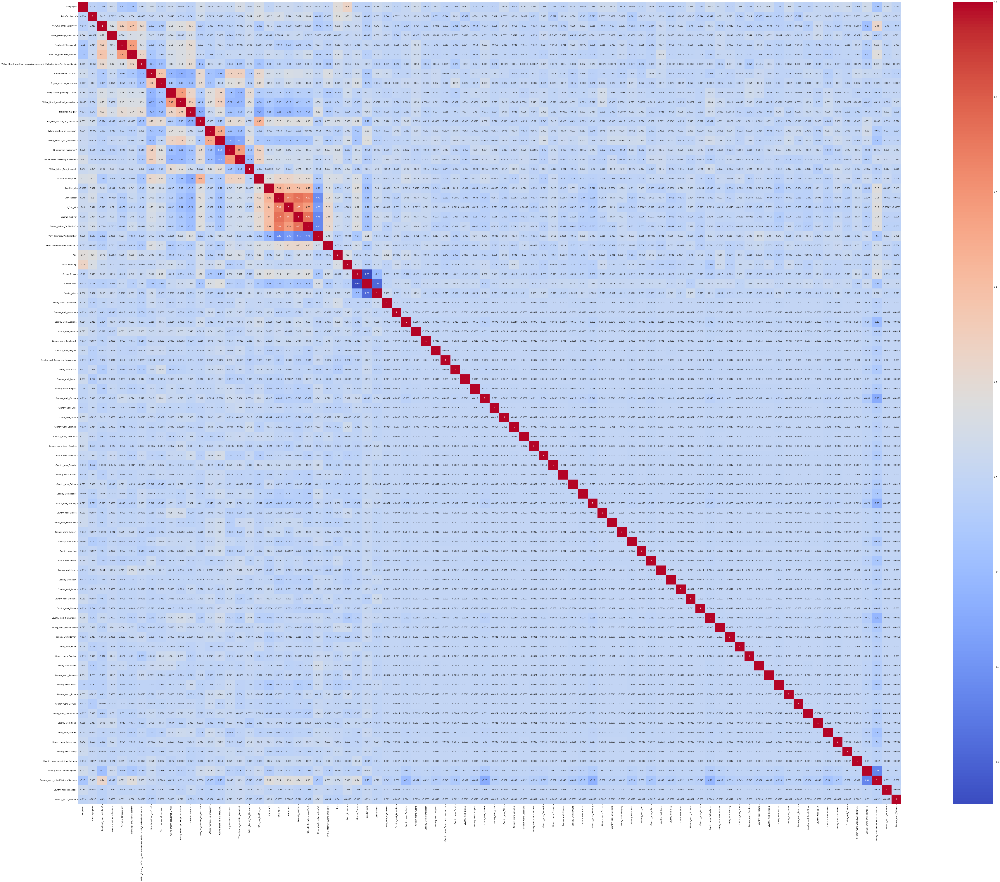

In [64]:
# Generate heatmap
plt.figure(figsize=(100, 80))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

In [65]:
 # Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper  

C:\Users\julia\AppData\Local\Temp/ipykernel_59832/886564374.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))


,s-employed,PrtevEmployers?,PrevEmpl_mhbenefitsProv?,Aware_prevEmpl_mhoptions,PrevEmpl_FDiscuss_mh,PrevEmpl_provideres_learnmh,Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit,DismhprevEmpl_-veCons?,Dis_ph_prevempl_-veconseq,Willing_Dismh_prevEmpl_C-Work,...,Country_work_South Africa,Country_work_Spain,Country_work_Sweden,Country_work_Switzerland,Country_work_Turkey,Country_work_United Arab Emirates,Country_work_United Kingdom,Country_work_United States of America,Country_work_Venezuela,Country_work_Vietnam
s-employed,NaN,-0.02411,-0.047816,0.044157,-0.105540,-0.130030,0.018732,0.069332,-0.006415,0.039347,...,-0.026554,0.015352,0.014981,0.042133,0.053098,-0.013263,0.070535,-0.128440,0.053098,-0.013263
PrtevEmployers?,NaN,NaN,0.016021,-0.002707,0.014217,0.033643,-0.005945,0.005952,0.019762,0.004250,...,0.019455,0.016842,0.006745,-0.021321,0.009717,0.009717,0.017149,0.054577,0.009717,0.009717
PrevEmpl_mhbenefitsProv?,NaN,NaN,NaN,0.115699,0.294458,0.365380,0.217634,-0.091693,-0.083900,0.121955,...,-0.059770,0.047852,-0.021386,-0.037968,-0.008305,-0.008305,-0.168776,0.240525,-0.029853,-0.029853
Aware_prevEmpl_mhoptions,NaN,NaN,NaN,NaN,0.065647,0.105910,0.119480,0.028121,0.007915,0.063741,...,0.010258,0.053442,-0.012814,0.030120,-0.020586,-0.020586,0.045535,-0.051715,0.005124,0.005124
PrevEmpl_FDiscuss_mh,NaN,NaN,NaN,NaN,NaN,0.560950,0.106989,-0.088089,-0.052110,0.110688,...,-0.029669,-0.025685,-0.023390,-0.017016,-0.014819,0.018949,-0.056431,0.079177,-0.014819,0.018949
PrevEmpl_provideres_learnmh,NaN,NaN,NaN,NaN,NaN,NaN,0.251930,-0.122941,-0.044204,0.084489,...,-0.029340,-0.025400,-0.054820,-0.018182,-0.014654,-0.014654,-0.108180,0.162985,-0.014654,0.018394
Willing_Dismh_prevEmpl_supervisorsAnonymityProtected_ifusePrevEmplmhbenfit,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.210963,-0.169141,0.085690,...,0.001471,-0.031514,-0.004996,-0.016572,-0.027640,0.000735,-0.049109,0.058857,0.000735,0.000735
DismhprevEmpl_-veCons?,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.355533,-0.230577,...,0.026141,0.012581,-0.056604,0.000217,-0.015935,0.053646,0.024733,0.020864,-0.015935,-0.039129
Dis_ph_prevempl_-veconseq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.129409,...,0.001560,0.014228,-0.037972,0.020384,-0.021510,0.008209,-0.027888,-0.004297,0.008209,0.008209
Willing_Dismh_prevEmpl_C-Work,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.006536,-0.026748,0.036163,-0.002100,0.003264,-0.024781,-0.019093,-0.029388,0.003264,0.003264


In [66]:
# Find index of feature columns with correlation greater than 0.5
key_variables = [column for column in upper.columns if any(upper[column] > 0.5)]
print(key_variables)

['PrevEmpl_provideres_learnmh', 'Willing_Dismh_prevEmpl_supervisors', 'Willing_mention_mh_interview?', 'TEam/Cowork_viewUNeg_KnowUmh', 'U_Curr_mh', 'Diagmh_medProf', 'USought_Rx4mh_frmMedProf?']


In [67]:
# Create a correlation matrix of just the  key variables
key_variables_corr_matrix = df_final[key_variables].corr()

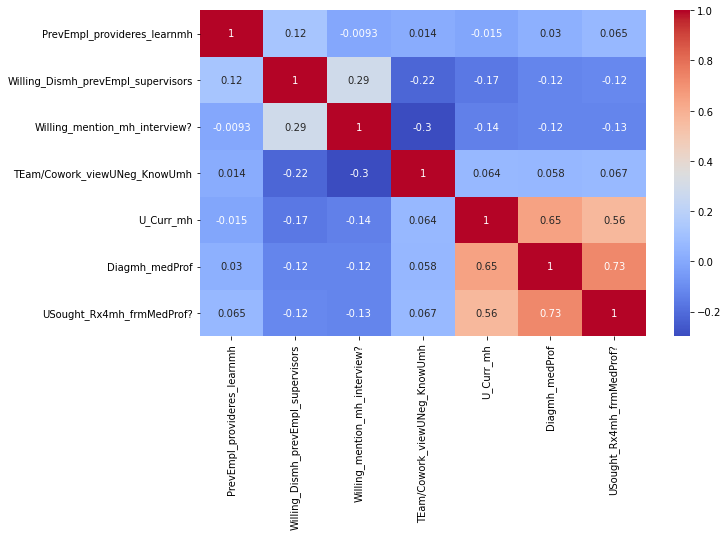

In [68]:
# Generate heatmap for key variables
plt.figure(figsize=(10, 6))
sns.heatmap(key_variables_corr_matrix, annot=True, cmap='coolwarm')
plt.show()

In [69]:
#Generate dataframe of just the key variables
df_x = df_final[key_variables]

In [70]:
dfX_std = StandardScaler().fit_transform(df_x)
dfX_std.shape

(1421, 7)

In [71]:
# Running PCA to redce dmensionality
pca = PCA().fit(dfX_std)

In [72]:
# extract the explaind variance ratios
var_exp = pca.explained_variance_ratio_
print(var_exp)

[0.34615236 0.20444147 0.14902841 0.10525877 0.095593   0.06281557
 0.03671042]


In [73]:
# calculate the explained cumulative variance
cum_var_exp = np.cumsum(var_exp)
print(cum_var_exp)

[0.34615236 0.55059383 0.69962224 0.80488101 0.90047401 0.96328958
 1.        ]


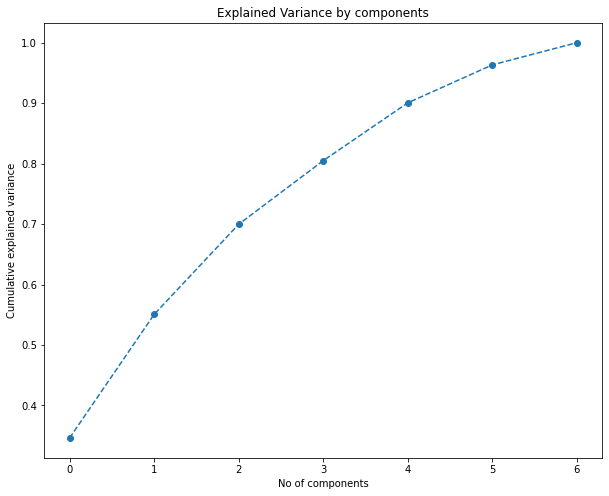

In [74]:
# Visualise Cumulative variance
plt.figure(figsize = (10,8))
plt.plot(var_exp.cumsum(), marker = 'o', linestyle = '--')
plt.title('Explained Variance by components')
plt.xlabel('No of components')
plt.ylabel('Cumulative explained variance')
plt.show()

In [75]:
# 4 components explains more than 80% variance therfore performing pca with 4 components
pca = PCA(n_components = 4)

In [76]:
# Fittting the model with  the number of selcted components
pca.fit(dfX_std)

PCA(n_components=4)

In [77]:
pca.transform(dfX_std)

array([[ 1.10019208,  0.91638997, -0.97964466, -0.61393156],
       [-1.55585931,  1.03870289,  0.29594838, -1.16800705],
       [ 1.48405113,  1.76840485,  0.56600678,  0.77186351],
       ...,
       [-0.96039379,  0.86709472,  0.40755801, -1.18401446],
       [-0.66929446, -0.11504424, -1.14718154, -1.48059204],
       [ 0.60317208, -0.1520621 , -0.70270891, -1.25604396]])

In [78]:
x_pca=pca.transform(dfX_std)

In [79]:
x_pca.shape

(1421, 4)

In [80]:
#fitting k means with PCA
wcss = []
for i in range(1,11):
    kmeans_pca=KMeans(n_clusters =i, init = 'k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans_pca.fit(x_pca)
    wcss.append(kmeans_pca.inertia_)

C:\Users\julia\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
C:\Users\julia\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
C:\Users\julia\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
C:\Users\julia\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Window

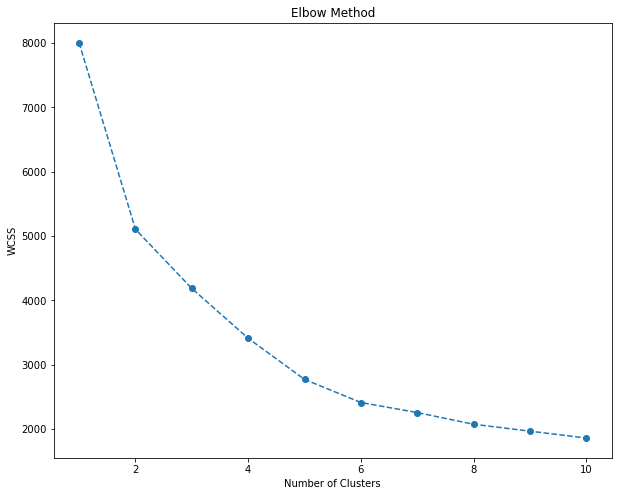

In [81]:
#Using Elbow method to choose the best number of clusters
plt.figure(figsize = (10,8)) 
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '--') 
plt.xlabel('Number of Clusters') 
plt.title('Elbow Method')
plt.ylabel('WCSS')
plt.show()


C:\Users\julia\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
C:\Users\julia\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
C:\Users\julia\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
C:\Users\julia\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Window

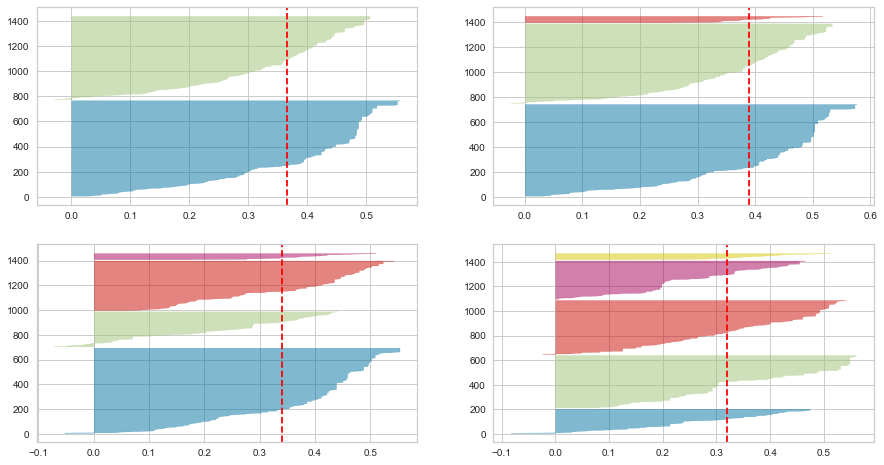

In [82]:
#Using Silhoute score to visualise distribution and score different numbers of clusters
from yellowbrick.cluster import SilhouetteVisualizer
 
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(x_pca) 

In [83]:
#  The best overall silhoutte score and strucure is obtained with 2 clusters - running K-means with number of clusters = 2
 
kmeans_pca = KMeans (n_clusters = 2, init = 'k-means++', random_state = 42)


In [84]:
# Fitting data with the k-means pca model 
kmeans_pca.fit(x_pca)

C:\Users\julia\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\julia\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


KMeans(n_clusters=2, random_state=42)

In [85]:
# Creating a new data frame with the original features and adding the PCA scores and assigned clusters. 
df_x_pca_kmeans = pd.concat([df_x.reset_index(drop = True), pd.DataFrame(x_pca)], axis = 1)
df_x_pca_kmeans.columns.values[-4: ] = ['PC1', 'PC2','PC3', 'PC4'] 
# The Last column we add contains the pca k-means clustering labels. 
df_x_pca_kmeans [ 'Segment K-means PCA'] = kmeans_pca.labels_

In [86]:
df_x_pca_kmeans.head()

,PrevEmpl_provideres_learnmh,Willing_Dismh_prevEmpl_supervisors,Willing_mention_mh_interview?,TEam/Cowork_viewUNeg_KnowUmh,U_Curr_mh,Diagmh_medProf,USought_Rx4mh_frmMedProf?,PC1,PC2,PC3,PC4,Segment K-means PCA
0,1.0,2.0,3.0,1.0,1.0,5.0,1.0,1.100192,0.916390,-0.979645,-0.613932,1
1,2.0,2.0,1.0,1.0,5.0,5.0,5.0,-1.555859,1.038703,0.295948,-1.168007,0
2,2.0,3.0,5.0,3.0,1.0,1.0,5.0,1.484051,1.768405,0.566007,0.771864,1
3,1.0,2.0,3.0,3.0,5.0,5.0,5.0,-1.385285,0.978823,-0.771835,0.444350,0
4,1.0,2.0,1.0,3.0,5.0,5.0,5.0,-1.738181,0.124499,-0.467847,0.158940,0


In [87]:
#Listing number of data points per cluster feature
df_x_pca_kmeans.groupby("Segment K-means PCA").count().T

Segment K-means PCA,0,1
PrevEmpl_provideres_learnmh,760,661
Willing_Dismh_prevEmpl_supervisors,760,661
Willing_mention_mh_interview?,760,661
TEam/Cowork_viewUNeg_KnowUmh,760,661
U_Curr_mh,760,661
Diagmh_medProf,760,661
USought_Rx4mh_frmMedProf?,760,661
PC1,760,661
PC2,760,661
PC3,760,661


In [88]:
# Listing mean per feature per cluster
df_x_pca_kmeans[["PrevEmpl_provideres_learnmh","Willing_Dismh_prevEmpl_supervisors","Willing_mention_mh_interview?","TEam/Cowork_viewUNeg_KnowUmh","U_Curr_mh","Diagmh_medProf","USought_Rx4mh_frmMedProf?","Segment K-means PCA"]].groupby("Segment K-means PCA").mean().T

Segment K-means PCA,0,1
PrevEmpl_provideres_learnmh,1.463553,1.420272
Willing_Dismh_prevEmpl_supervisors,1.837368,2.137368
Willing_mention_mh_interview?,1.705263,2.177005
TEam/Cowork_viewUNeg_KnowUmh,3.202632,2.927383
U_Curr_mh,4.226316,1.714070
Diagmh_medProf,4.657895,1.078669
USought_Rx4mh_frmMedProf?,4.842105,1.593041


In [89]:
#Listing standard deviation per feature per cluster
df_x_pca_kmeans[["PrevEmpl_provideres_learnmh","Willing_Dismh_prevEmpl_supervisors","Willing_mention_mh_interview?","TEam/Cowork_viewUNeg_KnowUmh","U_Curr_mh","Diagmh_medProf","USought_Rx4mh_frmMedProf?","Segment K-means PCA"]].groupby("Segment K-means PCA").std().T

Segment K-means PCA,0,1
PrevEmpl_provideres_learnmh,0.790074,0.818136
Willing_Dismh_prevEmpl_supervisors,0.856148,1.088721
Willing_mention_mh_interview?,1.169428,1.344061
TEam/Cowork_viewUNeg_KnowUmh,1.552250,1.495708
U_Curr_mh,1.295108,1.148754
Diagmh_medProf,1.119390,0.555836
USought_Rx4mh_frmMedProf?,0.779389,1.422507


In [90]:
# Listing loading per component per feature
loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2','PC3', 'PC4'], index=df_x.columns)
loadings

,PC1,PC2,PC3,PC4
PrevEmpl_provideres_learnmh,-0.014711,0.159986,0.902989,-0.335652
Willing_Dismh_prevEmpl_supervisors,0.221610,0.510990,0.243850,0.602261
Willing_mention_mh_interview?,0.224920,0.544505,-0.193747,0.181907
TEam/Cowork_viewUNeg_KnowUmh,-0.153622,-0.547411,0.276219,0.695928
U_Curr_mh,-0.522435,0.150561,-0.097921,0.014044
Diagmh_medProf,-0.559081,0.220546,-0.022873,0.060567
USought_Rx4mh_frmMedProf?,-0.539420,0.214100,0.034649,0.057858


In [91]:
#Assigning each segment a name
df_x_pca_kmeans ['Segment'] = df_x_pca_kmeans ['Segment K-means PCA'].map({0: 'zero', 
                                                                                 1: 'one'})

C:\Users\julia\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


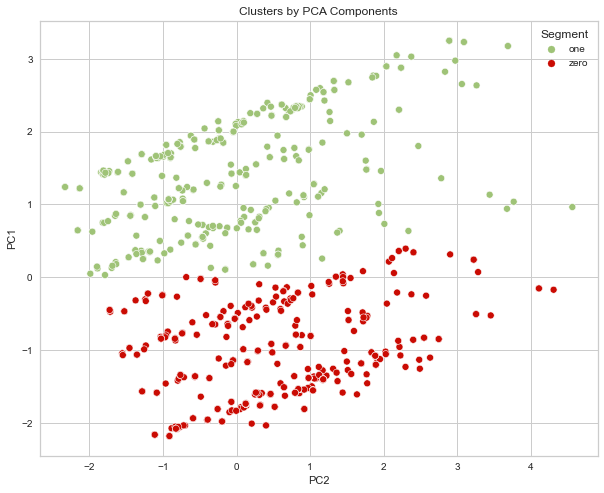

In [93]:
# Plot data by PCA components. Y axis is the first component, X axis is the second. 
x_axis= df_x_pca_kmeans [ 'PC2'] 
y_axis = df_x_pca_kmeans ['PC1'] 
plt.figure(figsize = (10, 8)) 
sns.scatterplot(x_axis, y_axis, hue = df_x_pca_kmeans [ 'Segment'], palette = ['g', 'r']) 
plt.title('Clusters by PCA Components') 
plt.show()

C:\Users\julia\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


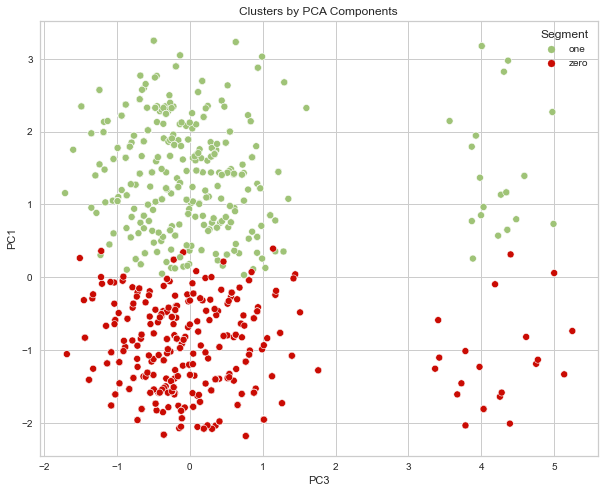

In [95]:
# Plot data by PCA components. Y axis is the first component, X axis is the third. 
x_axis= df_x_pca_kmeans [ 'PC3'] 
y_axis = df_x_pca_kmeans ['PC1'] 
plt.figure(figsize = (10, 8)) 
sns.scatterplot(x_axis, y_axis, hue = df_x_pca_kmeans [ 'Segment'], palette = ['g', 'r']) 
plt.title('Clusters by PCA Components') 
plt.show()

C:\Users\julia\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


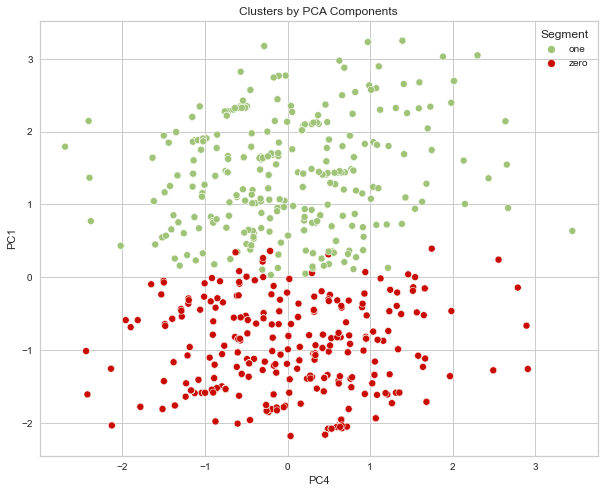

In [96]:
# Plot data by PCA components. Y axis is the first component, X axis is the fourth. 
x_axis= df_x_pca_kmeans [ 'PC4'] 
y_axis = df_x_pca_kmeans ['PC1'] 
plt.figure(figsize = (10, 8)) 
sns.scatterplot(x_axis, y_axis, hue = df_x_pca_kmeans [ 'Segment'], palette = ['g', 'r']) 
plt.title('Clusters by PCA Components') 
plt.show()